In [1]:
import scipy
import scipy.io
import seaborn as sns
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
print("installed")

installed


In [2]:
for root, dirs, files in os.walk("E:\Mydata",topdown=False):
    for file_name in files:
        path = os.path.join(root,file_name)
        print(path)

E:\Mydata\BA_14.mat
E:\Mydata\BA_21.mat
E:\Mydata\BA_7.mat
E:\Mydata\IR_14.mat
E:\Mydata\IR_21.mat
E:\Mydata\IR_7.mat
E:\Mydata\N.mat
E:\Mydata\OR_14.mat
E:\Mydata\OR_21.mat
E:\Mydata\OR_7.mat


In [3]:
path = r'E:\Mydata\BA_7.mat'
mat = scipy.io.loadmat(path)

In [4]:
mat.items()

dict_items([('__header__', b'MATLAB 5.0 MAT-file, Platform: PCWIN, Created on: Fri Jan 28 11:51:51 2000'), ('__version__', '1.0'), ('__globals__', []), ('X125_DE_time', array([[ 0.25305046],
       [ 0.25743138],
       [ 0.23844738],
       ...,
       [-0.09179077],
       [-0.20778092],
       [-0.29456492]])), ('X125_FE_time', array([[0.05382909],
       [0.12265636],
       [0.16251455],
       ...,
       [0.14196909],
       [0.18593636],
       [0.18963455]])), ('X125RPM', array([[1721]], dtype=uint16))])

In [5]:
list(mat.keys())

['__header__',
 '__version__',
 '__globals__',
 'X125_DE_time',
 'X125_FE_time',
 'X125RPM']

In [6]:
key_name = list(mat.keys())[3]
print(key_name)

X125_DE_time


In [7]:
DE_data = mat.get(key_name)
print(DE_data)

[[ 0.25305046]
 [ 0.25743138]
 [ 0.23844738]
 ...
 [-0.09179077]
 [-0.20778092]
 [-0.29456492]]


In [8]:
fault = np.full((len(DE_data),1),file_name[:-4])
print(file_name)

OR_7.mat


In [9]:
df_temp = pd.DataFrame({'DE_data':np.ravel(DE_data),'fault':np.ravel(fault)})
df_temp

,DE_data,fault
0,0.253050,OR_7
1,0.257431,OR_7
2,0.238447,OR_7
3,0.218838,OR_7
4,0.191718,OR_7
...,...,...
488540,0.120371,OR_7
488541,0.019193,OR_7
488542,-0.091791,OR_7
488543,-0.207781,OR_7


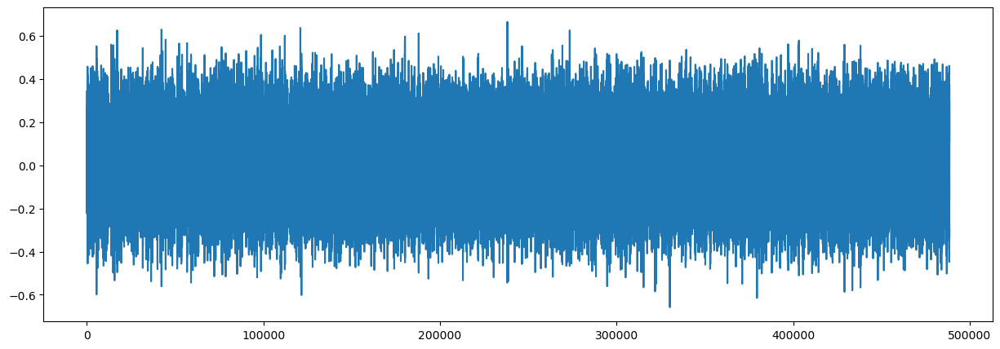

In [10]:
plt.figure(figsize=(15,5))
plt.plot(df_temp.iloc[:,0])
plt.show()

In [11]:
df = pd.DataFrame(columns=['DE_data','fault'])

for root, dirs, files in os.walk("E:\Mydata", topdown=False):
    for file_name in files:
        path = os.path.join(root,file_name)
        print(path)
        mat = scipy.io.loadmat(path)
        key_name = list(mat.keys())
        fault = np.full((len(DE_data),1),file_name[:-4])
        
        df_temp = pd.DataFrame({'DE_data':np.ravel(DE_data),'fault':np.ravel(fault)})
        
        df = pd.concat([df,df_temp],axis=0)
        print(df['fault'].unique())

df.to_csv('all_faults.csv',index=False)

E:\Mydata\BA_14.mat
['BA_14']
E:\Mydata\BA_21.mat
['BA_14' 'BA_21']
E:\Mydata\BA_7.mat
['BA_14' 'BA_21' 'BA_7']
E:\Mydata\IR_14.mat
['BA_14' 'BA_21' 'BA_7' 'IR_14']
E:\Mydata\IR_21.mat
['BA_14' 'BA_21' 'BA_7' 'IR_14' 'IR_21']
E:\Mydata\IR_7.mat
['BA_14' 'BA_21' 'BA_7' 'IR_14' 'IR_21' 'IR_7']
E:\Mydata\N.mat
['BA_14' 'BA_21' 'BA_7' 'IR_14' 'IR_21' 'IR_7' 'N']
E:\Mydata\OR_14.mat
['BA_14' 'BA_21' 'BA_7' 'IR_14' 'IR_21' 'IR_7' 'N' 'OR_14']
E:\Mydata\OR_21.mat
['BA_14' 'BA_21' 'BA_7' 'IR_14' 'IR_21' 'IR_7' 'N' 'OR_14' 'OR_21']
E:\Mydata\OR_7.mat
['BA_14' 'BA_21' 'BA_7' 'IR_14' 'IR_21' 'IR_7' 'N' 'OR_14' 'OR_21' 'OR_7']


In [12]:
df = pd.read_csv('all_faults.csv')

In [13]:
df

,DE_data,fault
0,0.253050,BA_14
1,0.257431,BA_14
2,0.238447,BA_14
3,0.218838,BA_14
4,0.191718,BA_14
...,...,...
4885445,0.120371,OR_7
4885446,0.019193,OR_7
4885447,-0.091791,OR_7
4885448,-0.207781,OR_7


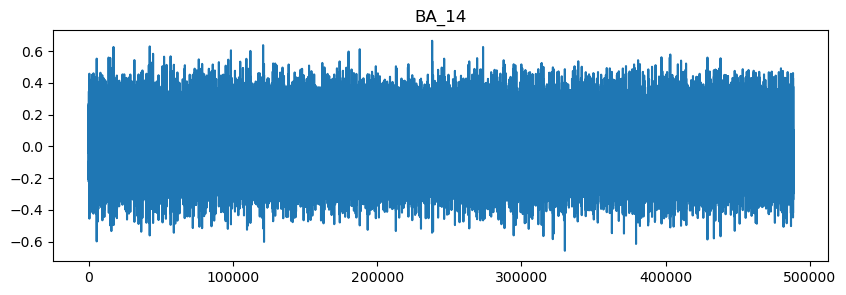

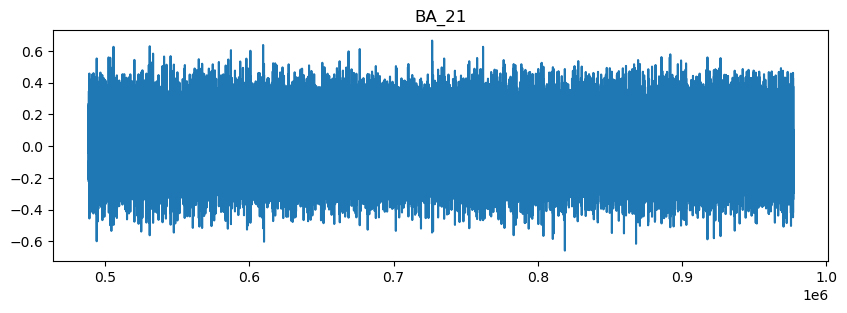

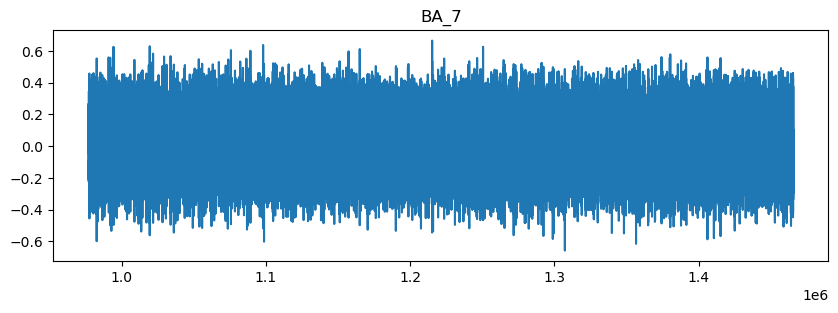

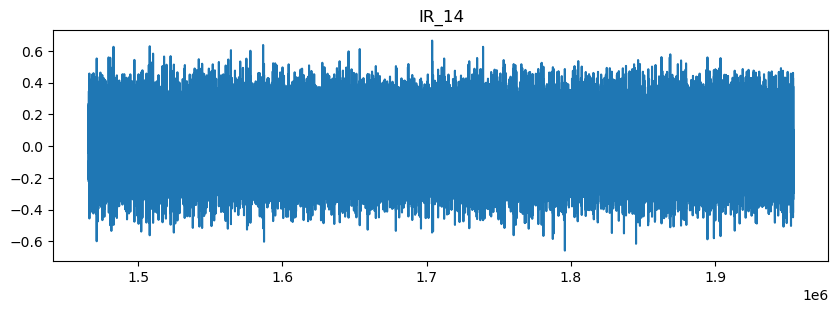

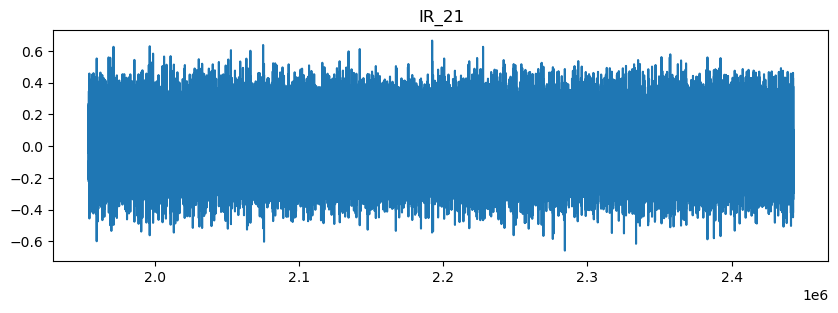

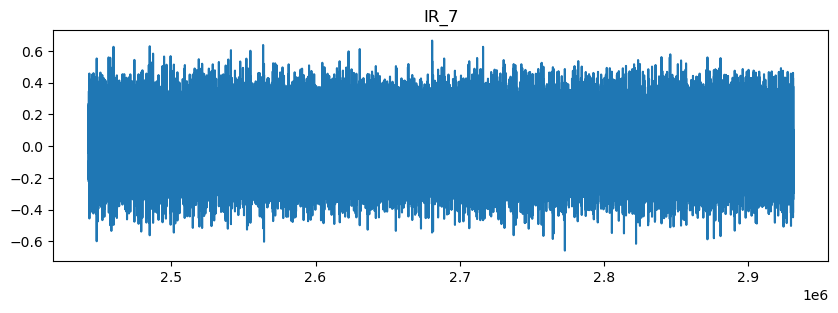

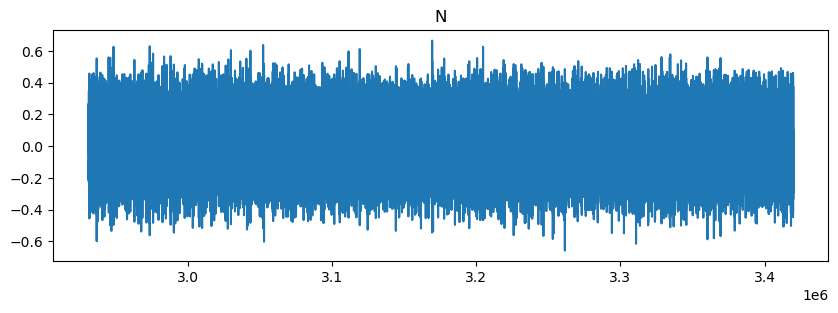

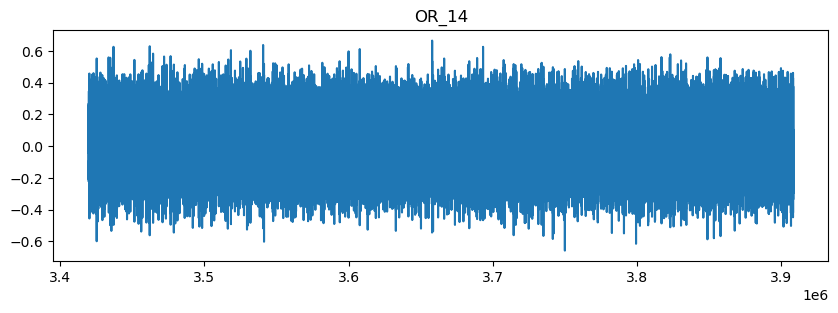

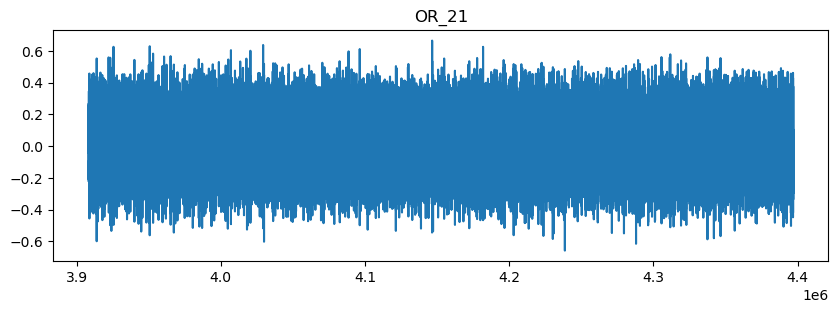

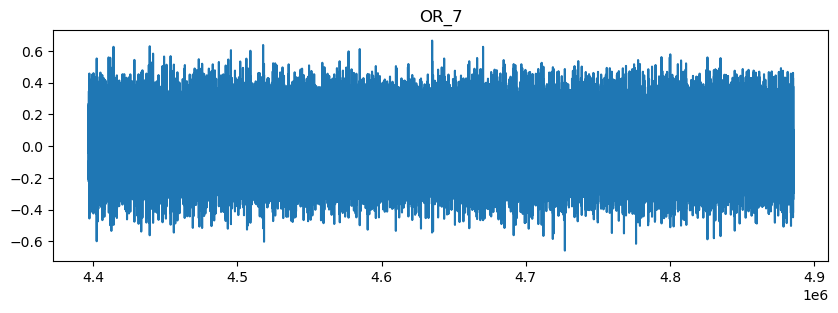

In [14]:
faults = df['fault'].unique()
for f in faults:
    plt.figure(figsize=(10,3))
    plt.plot(df[df['fault']==f].iloc[:,0])
    plt.title(f)
    plt.show()

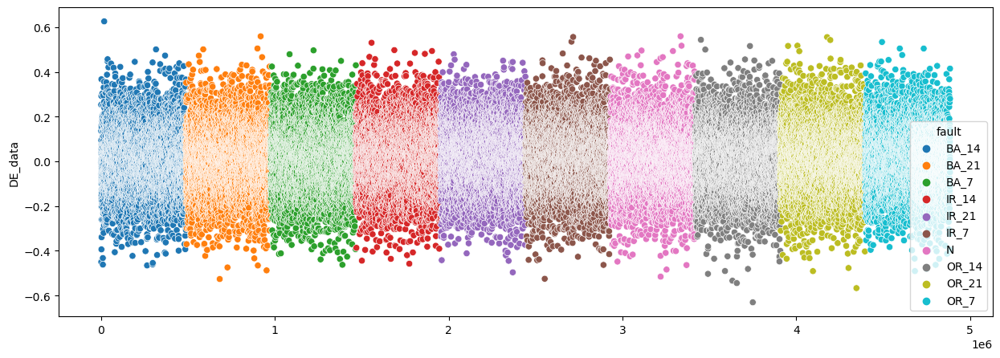

In [15]:
plt.figure(figsize=(15,5))
sns.scatterplot(data=df.iloc[::100,:],y='DE_data',x=np.arange(0,len(df),100),hue='fault')
plt.show()

In [16]:
df = pd.read_csv('all_faults.csv')

In [17]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical

win_len = 4096
stride = 100

X=[]
Y=[]

for k in df['fault'].unique():
    df_temp_2 = df[df['fault']==k]
    
    #created an array of starting indices for window length from dataframe df
    indices = np.arange(0,len(df_temp_2)-win_len,stride)
    #used the random and shuffle methods to randomize the selection of starting index
    np.random.shuffle(indices)
    
    for i in indices:
        temp = df_temp_2.iloc[i:i+win_len,:-1].values
        temp = temp.reshape((1,-1))
        X.append(temp)
        Y.append(df_temp_2.iloc[i+win_len,-1])
        
#numpy array for values
X = np.array(X)
X = X.reshape((X.shape[0],64,64,1))

Y = np.array(Y)
encoder = LabelEncoder()
encoder.fit(Y)
encoded_Y = encoder.transform(Y)
OHE_Y = to_categorical(encoded_Y)

print(X.shape)

(48450, 64, 64, 1)


In [18]:
print(len(indices))
print(X)

4845
[[[[ 0.14457046]
   [ 0.10096985]
   [ 0.03755077]
   ...
   [ 0.002712  ]
   [ 0.01001354]
   [ 0.02315631]]

  [[ 0.01940123]
   [-0.00834462]
   [-0.05361415]
   ...
   [ 0.28267385]
   [ 0.260352  ]
   [ 0.21883754]]

  [[ 0.15583569]
   [ 0.07781354]
   [ 0.01752369]
   ...
   [ 0.01001354]
   [ 0.04589538]
   [ 0.06759138]]

  ...

  [[-0.06070708]
   [ 0.02211323]
   [ 0.092208  ]
   ...
   [-0.17106462]
   [-0.10201292]
   [-0.00625846]]

  [[ 0.08511508]
   [ 0.15875631]
   [ 0.19714154]
   ...
   [-0.02774585]
   [ 0.04109723]
   [ 0.09992677]]

  [[ 0.12099692]
   [ 0.09992677]
   [ 0.05382277]
   ...
   [-0.17565415]
   [-0.14957723]
   [-0.13184492]]]


 [[[ 0.154584  ]
   [ 0.12537785]
   [ 0.08594954]
   ...
   [-0.18754523]
   [-0.21549969]
   [-0.21257908]]

  [[-0.18691938]
   [-0.14582215]
   [-0.08636677]
   ...
   [ 0.13664308]
   [ 0.15124615]
   [ 0.13914646]]

  [[ 0.09679754]
   [ 0.03692492]
   [-0.00792738]
   ...
   [ 0.07802215]
   [ 0.06738277]
   [ 0

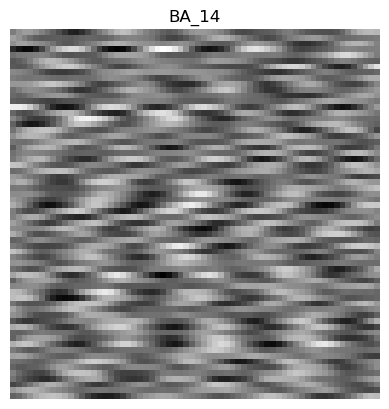

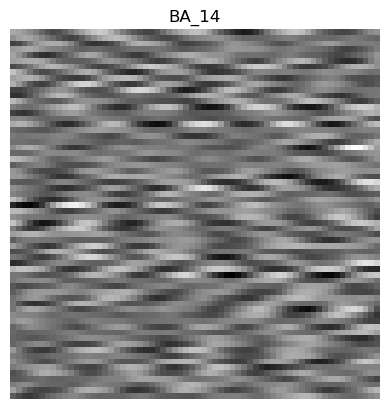

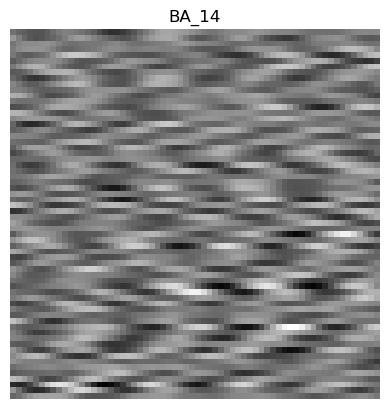

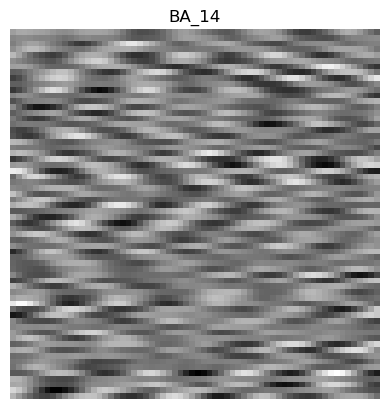

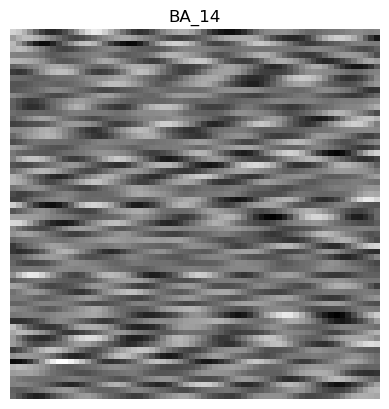

...

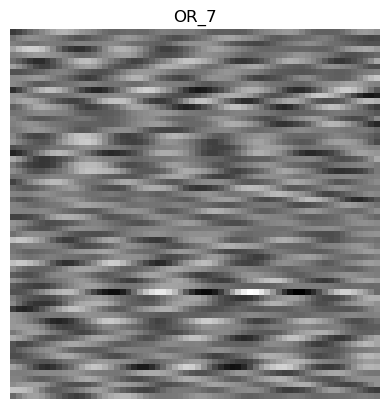

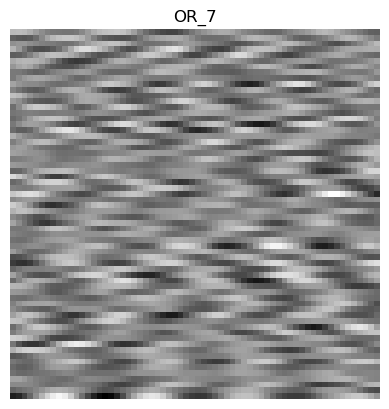

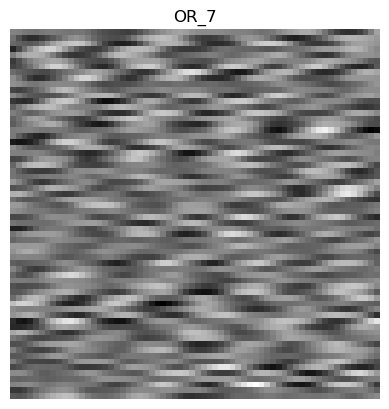

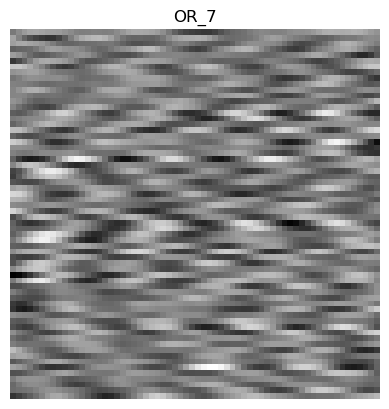

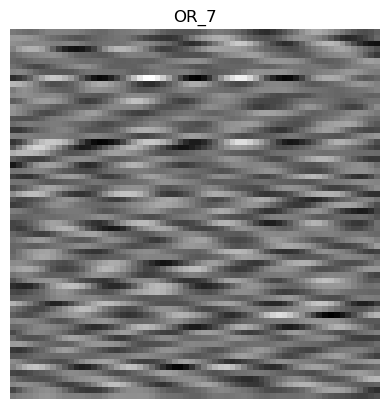

In [19]:
from matplotlib.pyplot import imread, imsave
import os

labels =[]
save_dir = 'gray_data'
os.makedirs(save_dir,exist_ok='True')

count = 1
for idx in range(0,48450,100):
    img = X[idx]
    np.random.shuffle(img)
    
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.title(Y[idx])
    labels.append(Y[idx])
    
    save_path = os.path.join(save_dir,f'image_{count}.png')
    plt.savefig(save_path)
    
    plt.show()
    count = count+1

In [20]:
print(count)

486


In [21]:
Y[idx]

'OR_7'

In [22]:
labels

['BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_14',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_21',
 'BA_7',
 'BA_7',
 'BA_7',
 'B

In [23]:
len(labels)

485

In [24]:
img_labels=[]
labelBA_14 =[]
labelBA_7 =[]
labelBA_21 =[]
labelIR_14 =[]
labelIR_7 =[]
labelIR_21 =[]
labelOR_14 =[]
labelOR_7 =[]
labelOR_21 =[]
labelN =[]

for i in range(0,len(labels)):
    if labels[i] == 'BA_14':
        labelBA_14.append(labels[i])
        continue
    elif labels[i] == 'BA_7':
        labelBA_7.append(labels[i])
        continue
    elif labels[i] == 'BA_21':
        labelBA_21.append(labels[i])
        continue
    elif labels[i] == 'IR_14':
        labelIR_14.append(labels[i])
        continue
    elif labels[i] == 'IR_7':
        labelIR_7.append(labels[i])
        continue
    elif labels[i] == 'IR_21':
        labelIR_21.append(labels[i])
        continue
    elif labels[i] == 'OR_14':
        labelOR_14.append(labels[i])
        continue
    elif labels[i] == 'OR_7':
        labelOR_7.append(labels[i])
        continue
    elif labels[i] == 'OR_21':
        labelOR_21.append(labels[i])
        continue
    elif labels[i] == 'N':
        labelN.append(labels[i])
        continue

In [25]:
img_labels.append(labelBA_14)

In [26]:
img_labels.append(labelBA_21)

In [27]:
img_labels.append(labelBA_7)

In [28]:
img_labels.append(labelIR_14)

In [29]:
img_labels.append(labelIR_21)

In [30]:
img_labels.append(labelIR_7)

In [31]:
img_labels.append(labelN)

In [32]:
img_labels.append(labelOR_14)

In [33]:
img_labels.append(labelOR_21)

In [34]:
img_labels.append(labelOR_7)

In [35]:
img_labels

[['BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14',
  'BA_14'],
 ['BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21',
  'BA_21'

In [36]:
len(img_labels)

10

In [37]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

In [38]:
dataset_path = 'E:/grayscale images'
num_classes = len(img_labels)

In [62]:
img_size = (64,64)
batch_size = 1

In [63]:
datagen = ImageDataGenerator(rescale=1/.255, validation_split = 0.3)

In [64]:
full_dataset = datagen.flow_from_directory(
    dataset_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,)

Found 485 images belonging to 10 classes.


In [65]:
full_dataset

In [66]:
len(full_dataset)

485

In [67]:
filenames = full_dataset.filenames

In [68]:
labels = full_dataset.labels.astype(str)

In [69]:
labels

array(['0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '1', '1',
       '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1',
       '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1',
       '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1',
       '1', '1', '1', '1', '1', '1', '2', '2', '2', '2', '2', '2', '2',
       '2', '2', '2', '2', '2', '2', '2', '2', '2', '2', '2', '2', '2',
       '2', '2', '2', '2', '2', '2', '2', '2', '2', '2', '2', '2', '2',
       '2', '2', '2', '2', '2', '2', '2', '2', '2', '2', '2', '2', '2',
       '2', '2', '2', '3', '3', '3', '3', '3', '3', '3', '3', '3', '3',
       '3', '3', '3', '3', '3', '3', '3', '3', '3', '3', '3', '3', '3',
       '3', '3', '3', '3', '3', '3', '3', '3', '3', '3', '3', '3

In [70]:
train_filenames,test_filenames,train_labels,test_labels = train_test_split(filenames,labels,test_size=0.3,random_state=42)

In [71]:
train_dataset = datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({'filename': train_filenames, 'label': train_labels}),
    directory=dataset_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    x_col="filename",
    y_col="label",
)

test_dataset = datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({'filename': test_filenames, 'label': test_labels}),
    directory=dataset_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False,  # No need to shuffle the test set
    x_col="filename",
    y_col="label",
)

Found 339 validated image filenames belonging to 10 classes.
Found 146 validated image filenames belonging to 10 classes.


In [72]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Assuming 10 classes for num_classes, you can adjust it based on your dataset
num_classes = 10  

alexnet_model = models.Sequential([
    layers.Conv2D(96, (11, 11), strides=(4, 4), activation='relu', input_shape=(64, 64, 1)),
    layers.MaxPooling2D((2, 2), strides=(2, 2)),
    layers.Conv2D(256, (5, 5), activation='relu', padding='same'),
    layers.MaxPooling2D((2, 2), strides=(2, 2)),
    layers.Conv2D(384, (3, 3), activation='relu', padding='same'),
    layers.Conv2D(384, (3, 3), activation='relu', padding='same'),
    layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
    layers.MaxPooling2D((2, 2), strides=(2, 2)),
    layers.Flatten(),
    layers.Dense(4096, activation='relu'),
    layers.Dense(4096, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])

# Compile the model
alexnet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
alexnet_model.summary()


Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_35 (Conv2D)          (None, 14, 14, 96)        11712     
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 7, 7, 96)          0         
 ng2D)                                                           
                                                                 
 conv2d_36 (Conv2D)          (None, 7, 7, 256)         614656    
                                                                 
 max_pooling2d_22 (MaxPooli  (None, 3, 3, 256)         0         
 ng2D)                                                           
                                                                 
 conv2d_37 (Conv2D)          (None, 3, 3, 384)         885120    
                                                                 
 conv2d_38 (Conv2D)          (None, 3, 3, 384)        

In [73]:
num_epochs=10
alexnet_model.fit(train_dataset,validation_data=test_dataset,epochs=num_epochs)

Epoch 1/10


UnimplementedError: Graph execution error:

Detected at node sequential_7/conv2d_35/Relu defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel_launcher.py", line 17, in <module>

  File "C:\Users\HP User\anaconda3\Lib\site-packages\traitlets\config\application.py", line 992, in launch_instance

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelapp.py", line 711, in start

  File "C:\Users\HP User\anaconda3\Lib\site-packages\tornado\platform\asyncio.py", line 215, in start

  File "C:\Users\HP User\anaconda3\Lib\asyncio\base_events.py", line 607, in run_forever

  File "C:\Users\HP User\anaconda3\Lib\asyncio\base_events.py", line 1922, in _run_once

  File "C:\Users\HP User\anaconda3\Lib\asyncio\events.py", line 80, in _run

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 510, in dispatch_queue

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 499, in process_one

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 406, in dispatch_shell

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 729, in execute_request

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\ipkernel.py", line 411, in do_execute

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\zmqshell.py", line 531, in run_cell

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3006, in run_cell

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3061, in _run_cell

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3266, in run_cell_async

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3445, in run_ast_nodes

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3505, in run_code

  File "C:\Users\HP User\AppData\Local\Temp\ipykernel_15204\1733441360.py", line 2, in <module>

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1783, in fit

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1377, in train_function

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1360, in step_function

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1349, in run_step

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1126, in train_step

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 589, in __call__

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\base_layer.py", line 1149, in __call__

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 96, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\sequential.py", line 398, in call

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\functional.py", line 515, in call

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\functional.py", line 672, in _run_internal_graph

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\base_layer.py", line 1149, in __call__

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 96, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py", line 321, in call

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\activations.py", line 306, in relu

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\backend.py", line 5397, in relu

Fused conv implementation does not support grouped convolutions for now.
	 [[{{node sequential_7/conv2d_35/Relu}}]] [Op:__inference_train_function_9423]

In [54]:
from tensorflow.keras import layers, models

# Number of classes in your dataset
num_classes = 10  # Update with the actual number of classes in your dataset

# AlexNet model
alexnet_model = models.Sequential([
    layers.Conv2D(96, (11, 11), strides=(4, 4), activation='relu', input_shape=(64, 64, 1)),
    layers.MaxPooling2D((2, 2)),  # Adjusted pool size
    layers.Conv2D(256, (5, 5), activation='relu', padding='same'),
    layers.MaxPooling2D((2, 2)),  # Adjusted pool size
    layers.Conv2D(384, (3, 3), activation='relu', padding='same'),
    layers.Conv2D(384, (3, 3), activation='relu', padding='same'),
    layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
    layers.MaxPooling2D((2, 2)),  # Adjusted pool size
    layers.Flatten(),
    layers.Dense(4096, activation='relu'),
    layers.Dense(4096, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])

# Compile the model
alexnet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
alexnet_model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 14, 14, 96)        11712     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 7, 7, 96)          0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 7, 7, 256)         614656    
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 3, 3, 256)         0         
 g2D)                                                            
                                                                 
 conv2d_12 (Conv2D)          (None, 3, 3, 384)         885120    
                                                                 
 conv2d_13 (Conv2D)          (None, 3, 3, 384)        

In [55]:
num_epochs=10

In [56]:
alexnet_model.fit(train_dataset,validation_data=test_dataset,epochs=num_epochs)

Epoch 1/10


UnimplementedError: Graph execution error:

Detected at node sequential_2/conv2d_10/Relu defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel_launcher.py", line 17, in <module>

  File "C:\Users\HP User\anaconda3\Lib\site-packages\traitlets\config\application.py", line 992, in launch_instance

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelapp.py", line 711, in start

  File "C:\Users\HP User\anaconda3\Lib\site-packages\tornado\platform\asyncio.py", line 215, in start

  File "C:\Users\HP User\anaconda3\Lib\asyncio\base_events.py", line 607, in run_forever

  File "C:\Users\HP User\anaconda3\Lib\asyncio\base_events.py", line 1922, in _run_once

  File "C:\Users\HP User\anaconda3\Lib\asyncio\events.py", line 80, in _run

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 510, in dispatch_queue

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 499, in process_one

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 406, in dispatch_shell

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 729, in execute_request

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\ipkernel.py", line 411, in do_execute

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\zmqshell.py", line 531, in run_cell

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3006, in run_cell

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3061, in _run_cell

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3266, in run_cell_async

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3445, in run_ast_nodes

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3505, in run_code

  File "C:\Users\HP User\AppData\Local\Temp\ipykernel_15204\625535804.py", line 1, in <module>

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1783, in fit

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1377, in train_function

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1360, in step_function

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1349, in run_step

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1126, in train_step

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 589, in __call__

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\base_layer.py", line 1149, in __call__

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 96, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\sequential.py", line 398, in call

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\functional.py", line 515, in call

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\functional.py", line 672, in _run_internal_graph

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\base_layer.py", line 1149, in __call__

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 96, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py", line 321, in call

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\activations.py", line 306, in relu

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\backend.py", line 5397, in relu

Fused conv implementation does not support grouped convolutions for now.
	 [[{{node sequential_2/conv2d_10/Relu}}]] [Op:__inference_train_function_4455]

In [53]:
from tensorflow.keras import layers, models

# Number of classes in your dataset
num_classes = 10  # Update with the actual number of classes in your dataset

# AlexNet model
alexnet_model = models.Sequential([
    layers.Conv2D(96, (11, 11), strides=(4, 4), activation='relu', input_shape=(64, 64, 1)),
    layers.MaxPooling2D((3, 3), strides=(2, 2)),
    layers.Conv2D(256, (5, 5), activation='relu', padding='same'),
    layers.MaxPooling2D((3, 3), strides=(2, 2)),
    layers.Conv2D(384, (3, 3), activation='relu', padding='same'),
    layers.Conv2D(384, (3, 3), activation='relu', padding='same'),
    layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
    layers.MaxPooling2D((3, 3), strides=(2, 2)),
    layers.Flatten(),
    layers.Dense(4096, activation='relu'),
    layers.Dense(4096, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])

# Compile the model
alexnet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
alexnet_model.summary()


ValueError: Exception encountered when calling layer "max_pooling2d_5" (type MaxPooling2D).

Negative dimension size caused by subtracting 3 from 2 for '{{node max_pooling2d_5/MaxPool}} = MaxPool[T=DT_FLOAT, data_format="NHWC", explicit_paddings=[], ksize=[1, 3, 3, 1], padding="VALID", strides=[1, 2, 2, 1]](Placeholder)' with input shapes: [?,2,2,256].

Call arguments received by layer "max_pooling2d_5" (type MaxPooling2D):
  • inputs=tf.Tensor(shape=(None, 2, 2, 256), dtype=float32)

In [49]:
input_shape=(64,64,1)
num_classes=10

alexnet_model = models.Sequential([
    layers.Conv2D(96,(11,11),strides=(4,4),activation='relu',input_shape=input_shape),
    layers.MaxPooling2D((2,2),strides=(2,2)),
    layers.Conv2D(256,(5,5),activation='relu',padding='same'),
    layers.MaxPooling2D((2,2),strides=(2,2)),
    layers.Conv2D(384,(3,3),activation='relu',padding='same'),
    layers.Conv2D(384,(3,3),activation='relu',padding='same'),
    layers.Conv2D(256,(3,3),activation='relu',padding='same'),
    layers.MaxPooling2D((2,2),strides=(2,2)),
    layers.Flatten(),
    layers.Dense(4096,activation='relu'),
    layers.Dense(4096,activation='relu'),
    layers.Dense(num_classes,activation='softmax')
])

In [50]:
alexnet_model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [51]:
num_epochs=10

In [52]:
alexnet_model.fit(train_dataset,validation_data=test_dataset,epochs=num_epochs)

Epoch 1/10


UnimplementedError: Graph execution error:

Detected at node sequential/conv2d/Relu defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel_launcher.py", line 17, in <module>

  File "C:\Users\HP User\anaconda3\Lib\site-packages\traitlets\config\application.py", line 992, in launch_instance

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelapp.py", line 711, in start

  File "C:\Users\HP User\anaconda3\Lib\site-packages\tornado\platform\asyncio.py", line 215, in start

  File "C:\Users\HP User\anaconda3\Lib\asyncio\base_events.py", line 607, in run_forever

  File "C:\Users\HP User\anaconda3\Lib\asyncio\base_events.py", line 1922, in _run_once

  File "C:\Users\HP User\anaconda3\Lib\asyncio\events.py", line 80, in _run

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 510, in dispatch_queue

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 499, in process_one

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 406, in dispatch_shell

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\kernelbase.py", line 729, in execute_request

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\ipkernel.py", line 411, in do_execute

  File "C:\Users\HP User\anaconda3\Lib\site-packages\ipykernel\zmqshell.py", line 531, in run_cell

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3006, in run_cell

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3061, in _run_cell

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3266, in run_cell_async

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3445, in run_ast_nodes

  File "C:\Users\HP User\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 3505, in run_code

  File "C:\Users\HP User\AppData\Local\Temp\ipykernel_15204\625535804.py", line 1, in <module>

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1783, in fit

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1377, in train_function

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1360, in step_function

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1349, in run_step

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1126, in train_step

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 589, in __call__

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\base_layer.py", line 1149, in __call__

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 96, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\sequential.py", line 398, in call

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\functional.py", line 515, in call

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\functional.py", line 672, in _run_internal_graph

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\engine\base_layer.py", line 1149, in __call__

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\utils\traceback_utils.py", line 96, in error_handler

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py", line 321, in call

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\activations.py", line 306, in relu

  File "C:\Users\HP User\anaconda3\Lib\site-packages\keras\src\backend.py", line 5397, in relu

Fused conv implementation does not support grouped convolutions for now.
	 [[{{node sequential/conv2d/Relu}}]] [Op:__inference_train_function_2152]